In [1]:
import numpy as np
import astropy.units as u
from astropy.io import fits
from matplotlib.colors import LogNorm
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload
from scipy.optimize import minimize

import poppy
import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)
poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

import apra_pop_models
from apra_pop_models.math_module import xp, xcipy, ensure_np_array
import apra_pop_models.fresnel_2dm as fresnel
import apra_pop_models.fraunhofer_2dm as fraunhofer
import apra_pop_models.dm as dm
import apra_pop_models.utils as utils
import apra_pop_models.props as props
from apra_pop_models.imshows import imshow1, imshow2, imshow3

/home/apra/miniconda3/envs/gpu311env/lib/python3.11/site-packages/cupyx/jit/_interface.py:173: FutureWarning: cupyx.jit.rawkernel is experimental. The interface can change in the future.
  cupy._util.experimental('cupyx.jit.rawkernel')


/home/apra/Projects/apra-howfsc-models/apra_pop_models


/home/apra/Projects/apra-howfsc-models/apra_pop_models


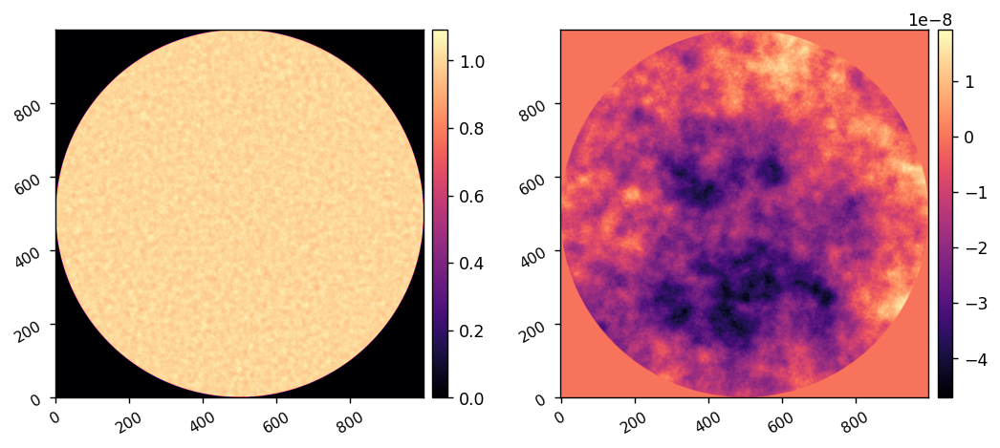

In [2]:
reload(fresnel)
reload(dm)
Nact = 34
npsf = 256

I = fresnel.CORO(
    Nact=Nact,
    npsf=npsf,
)
I.use_opds = True

AMP, OPD = I.calc_pupil()
imshow2(AMP, OPD)

/home/apra/Projects/apra-howfsc-models/apra_pop_models


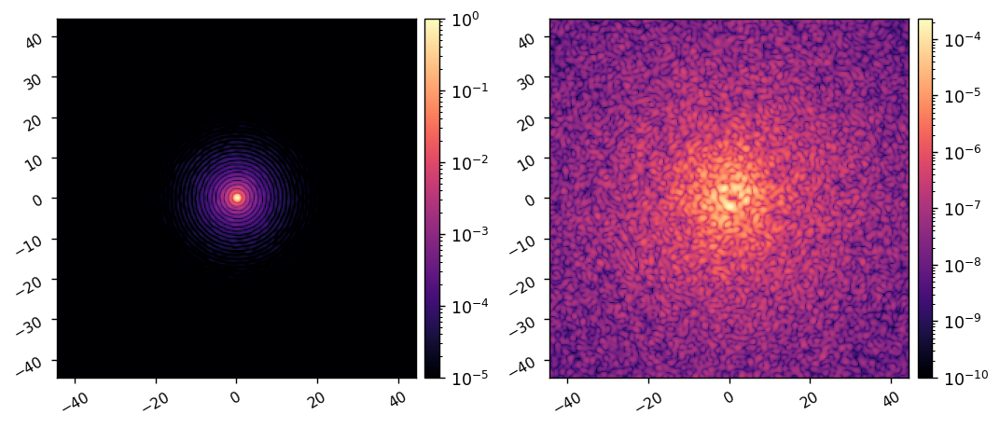

In [3]:
reload(fresnel)
reload(dm)

I = fresnel.CORO(
    Nact=Nact,
    npsf=npsf,
)
I.use_opds = True

I.use_vortex = False
ref_psf = I.snap()
I.Imax_ref = xp.max(ref_psf)
ref_psf /= I.Imax_ref
I.use_vortex = True
ref_coro_im = I.snap()

imshow2(
    ref_psf, ref_coro_im,
    pxscl=I.psf_pixelscale_lamDc, 
    lognorm=True, vmin1=1e-5, vmin2=1e-10,
)


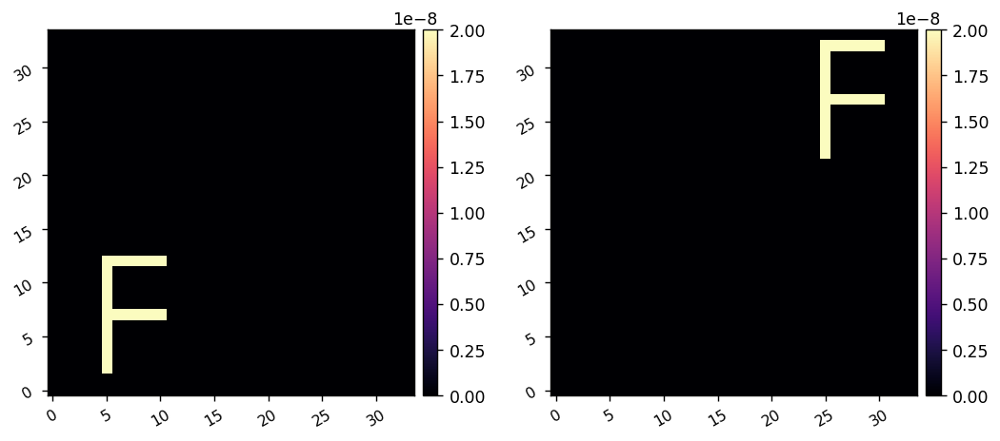

Propagating wavelength 0.000m.


OutOfMemoryError: Out of memory allocating 67,108,864 bytes (allocated so far: 6,934,666,752 bytes).

In [4]:
f1 = 20e-9 * utils.make_f(h=10, w=6, shift=(-10,-10), Nact=Nact)
f2 = 20e-9 * utils.make_f(h=10, w=6, shift=(10,10), Nact=Nact)
imshow2(f1, f2)

I.set_dm1(f1)
I.set_dm2(f2)
wfs = I.calc_wfs()
I.reset_dms()

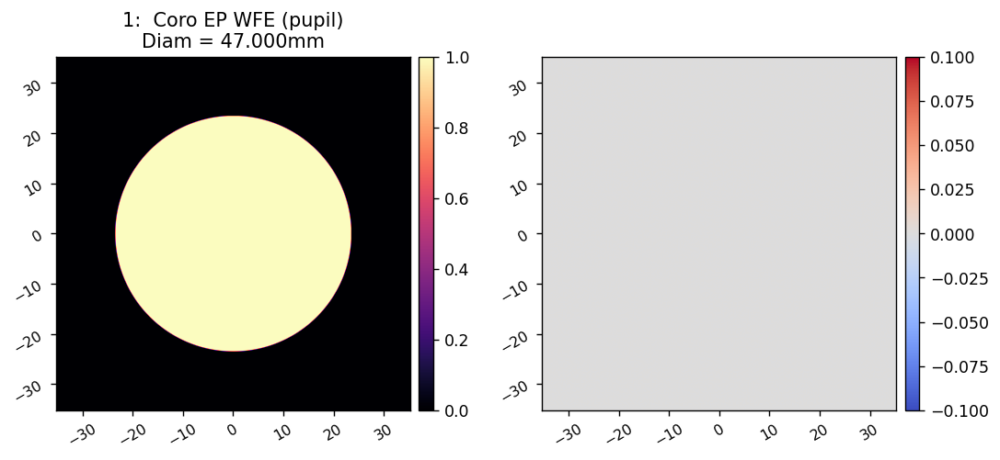

Focal Plane Correction:  -1.754548928367683e-05 mm


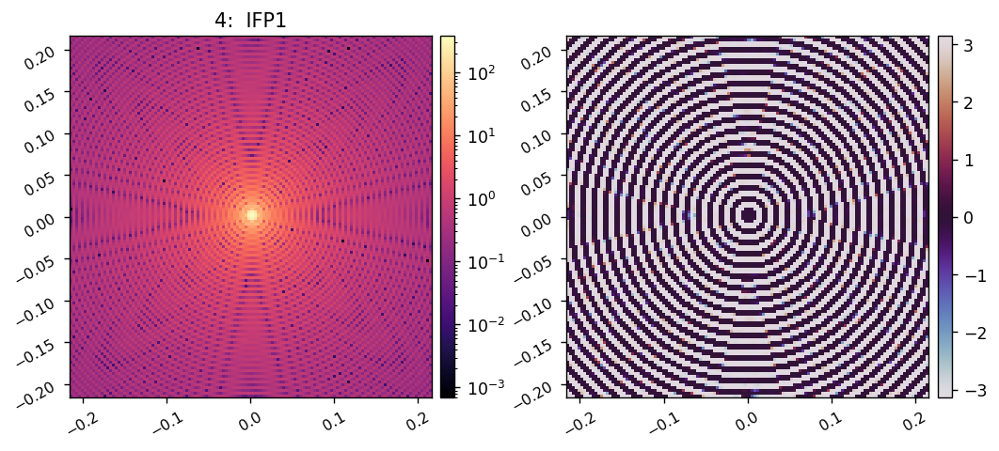

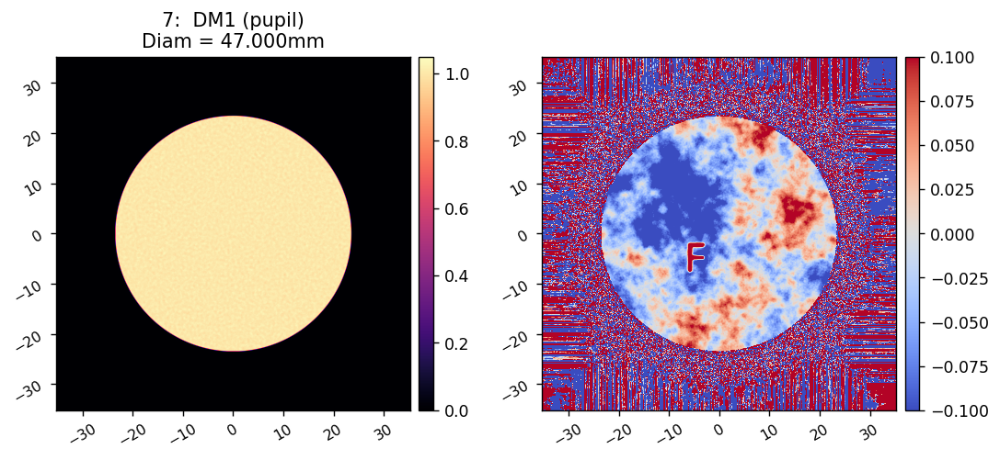

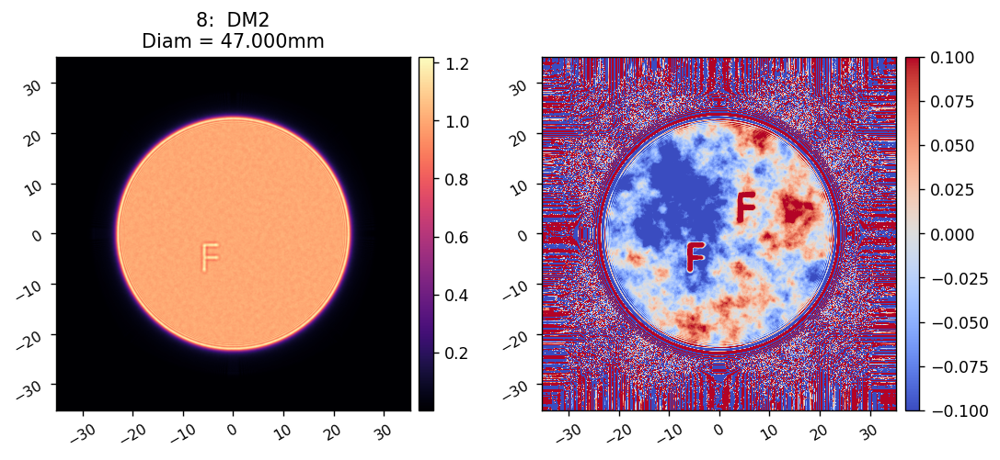

Focal Plane Correction:  -0.0001403638902885973 mm


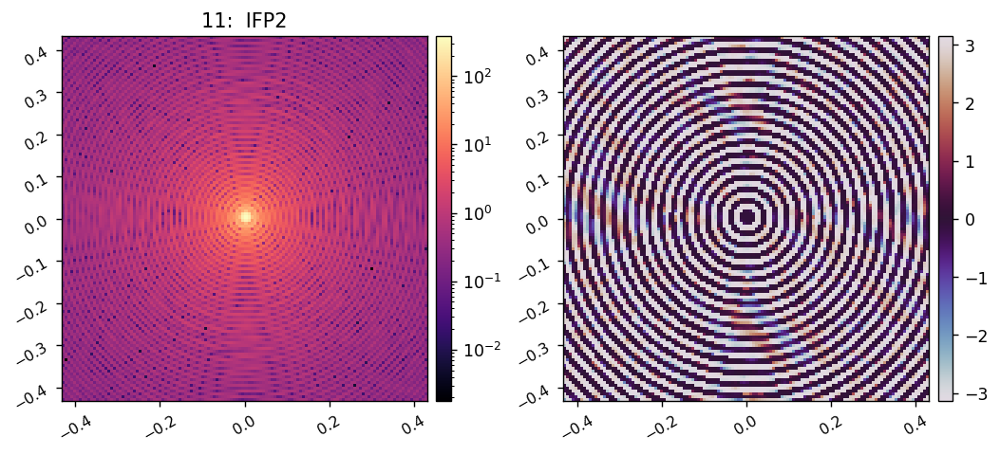

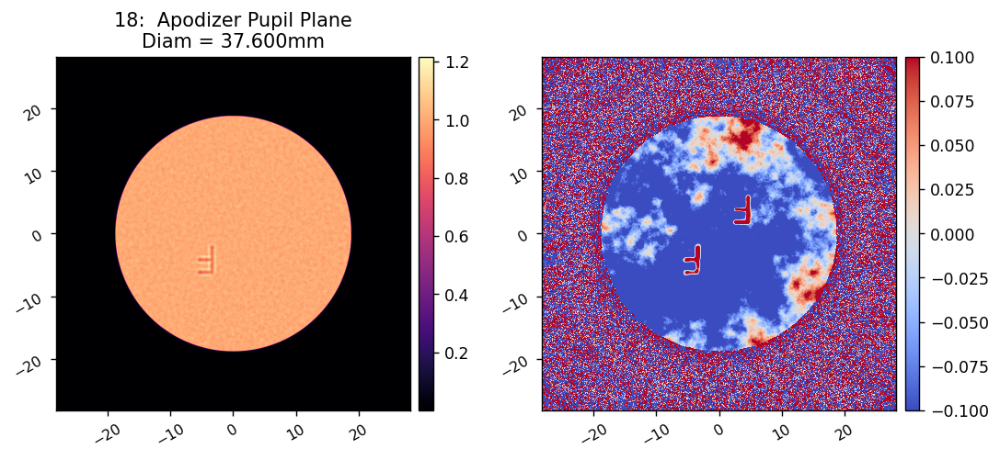

Focal Plane Correction:  -0.00017545484620740126 mm


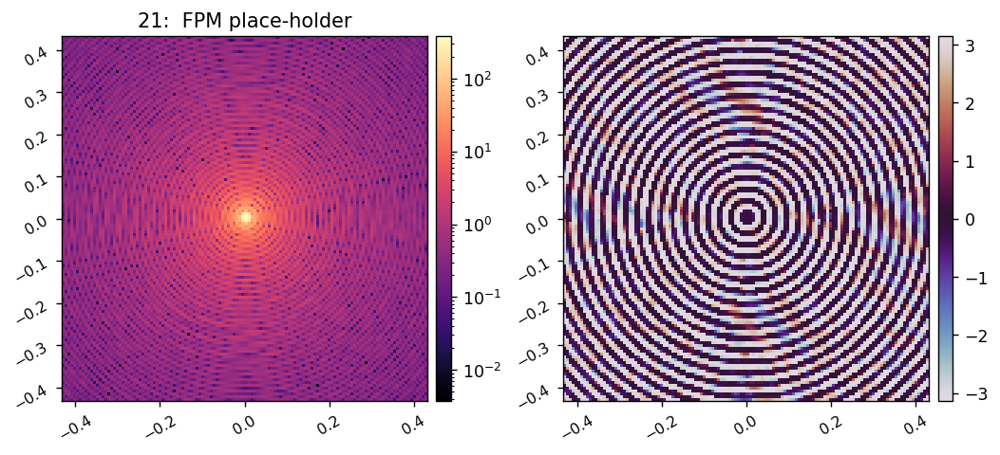

Focal Plane Correction:  -0.00017545484620740126 mm


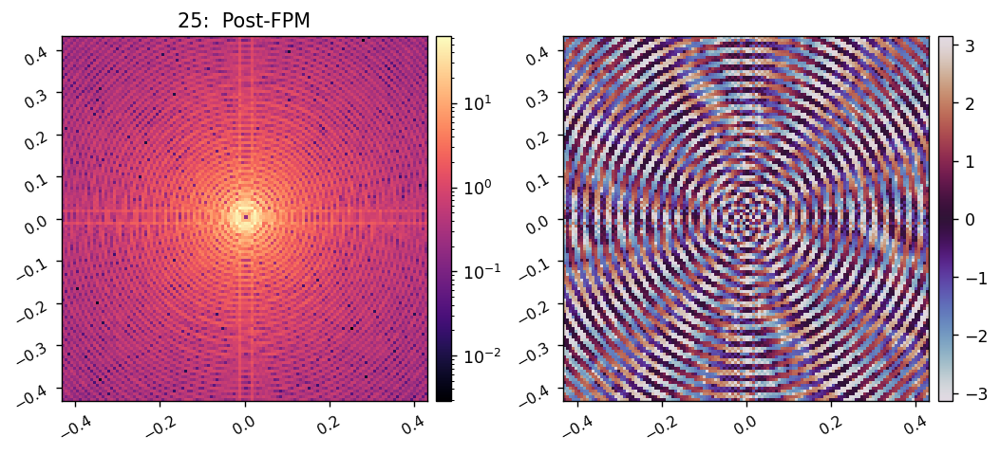

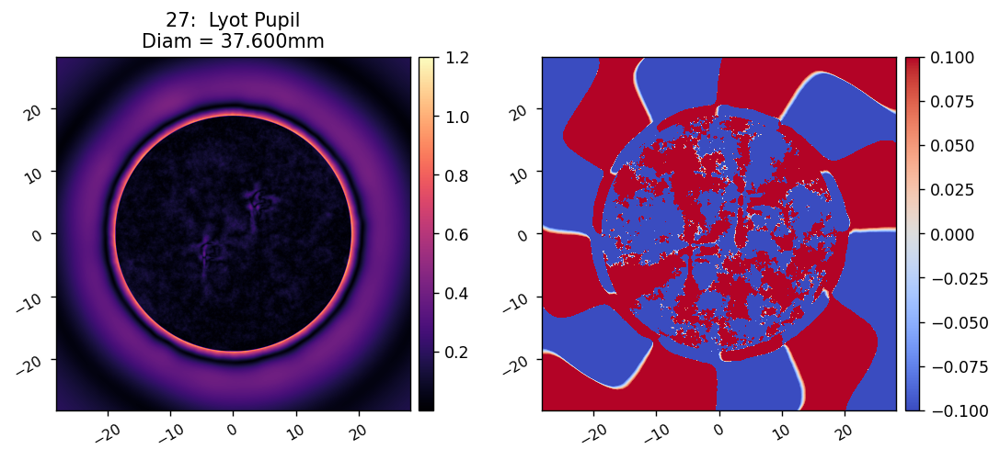

Focal Plane Correction:  -4.283565857576832e-05 mm


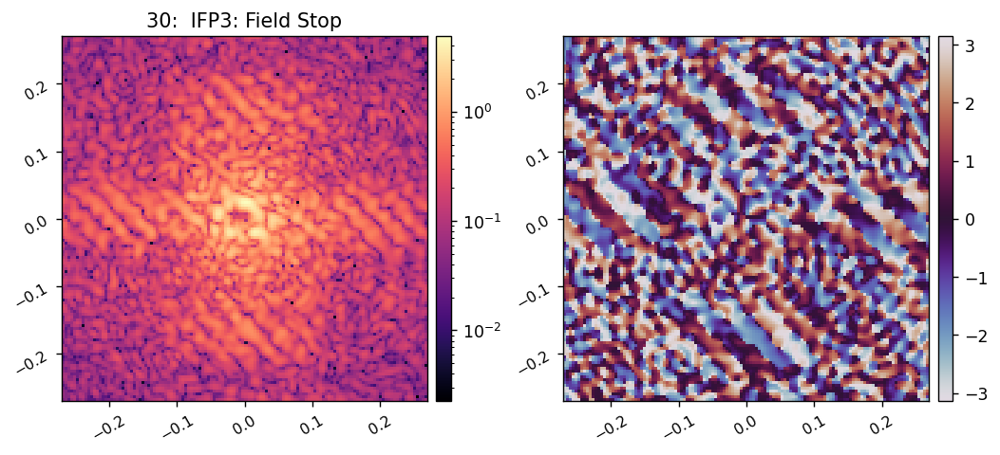

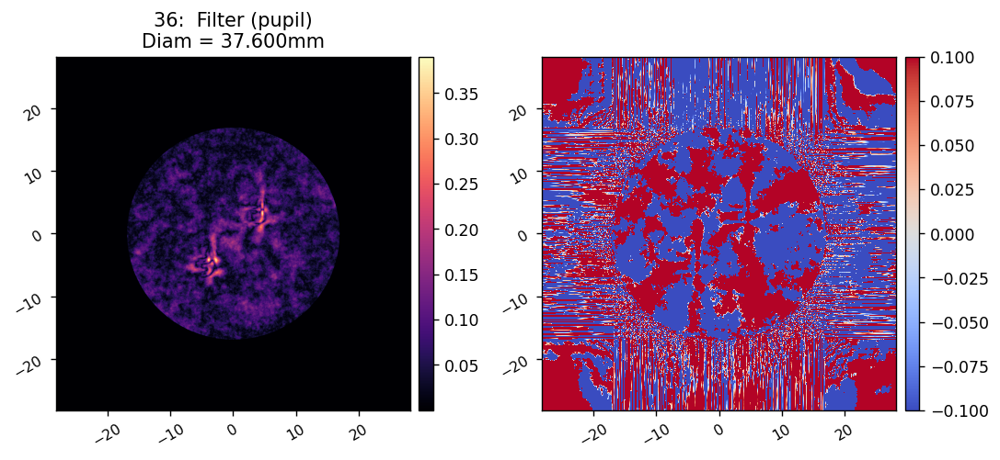

Focal Plane Correction:  -0.00014457032726511443 mm


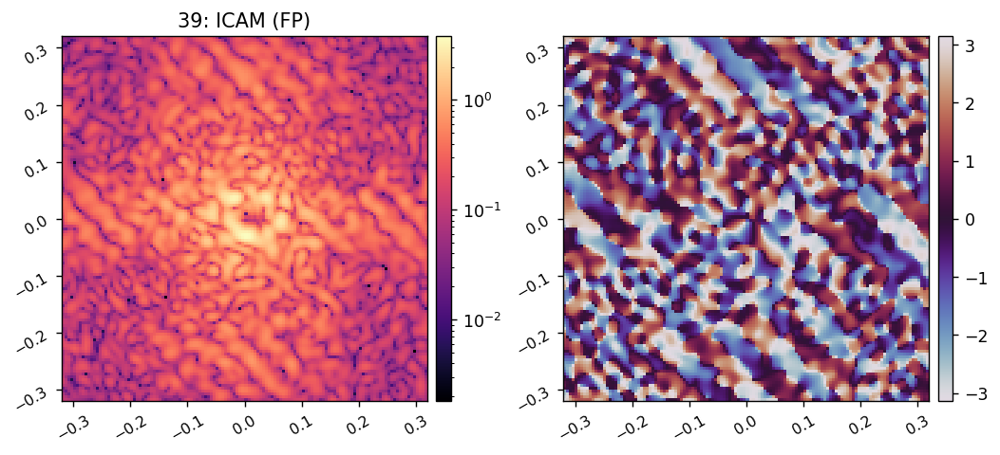

In [11]:
for i,wf in enumerate(wfs):
    if 'fp' in wf.location.lower():
        f_corr = wf.z_w0 - wf.z
        print('Focal Plane Correction: ', f_corr.to(u.mm))
        pxscl_mm = wf.pixelscale.to_value(u.mm/u.pix)
        imshow2(
            wf.amplitude, wf.phase, 
            f'{i:d}: '+wf.location[5:], 
            pxscl=pxscl_mm, 
            npix=128, 
            lognorm1=True, 
            cmap2='twilight',
        )
    elif 'pupil' in wf.location.lower() or 'dm' in wf.location.lower():
        imshow2(
            wf.amplitude, wf.phase, 
            f'{i:d}: '+wf.location[5:] + f'\nDiam = {2*wf.spot_radius().to_value(u.mm):.3f}mm', 
            pxscl=wf.pixelscale.to(u.mm/u.pix), 
            npix=1.5*I.npix, 
            vmin2=-0.1, vmax2=0.1, 
            # vmin2=-0.01, vmax2=0.01, 
            cmap2='coolwarm',
        )

(2048, 2048)
2048
700.0 mm
0.047 mm / pix
65.27577820789962
[-66809.75899579 -66744.48321758 -66679.20743937 ...  66679.20743937
  66744.48321758  66809.75899579]
2048
-700.0 mm
0.047 mm / pix
65.27577820789962
[-66809.75899579 -66744.48321758 -66679.20743937 ...  66679.20743937
  66744.48321758  66809.75899579]
(2048, 2048)
2048
700.0 mm
0.047 mm / pix
65.27577820789962
[-66809.75899579 -66744.48321758 -66679.20743937 ...  66679.20743937
  66744.48321758  66809.75899579]
2048
-700.0 mm
0.047 mm / pix
65.27577820789962
[-66809.75899579 -66744.48321758 -66679.20743937 ...  66679.20743937
  66744.48321758  66809.75899579]


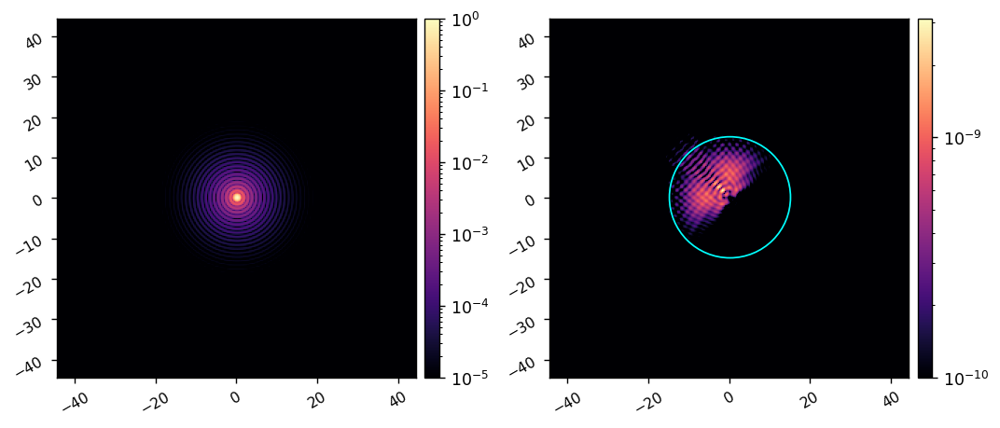

14.98125

In [4]:
reload(fraunhofer)
reload(props)
Nact = 34
npsf=256


M = fraunhofer.MODEL(
    Nact=Nact,
    npsf=npsf,
)
# M.AMP = AMP
# M.OPD = OPD

M.flip_dm = True
M.flip_lyot = True

acts = xp.zeros(M.Nacts)

model_psf = xp.abs( M.forward(acts, M.wavelength_c, use_vortex=0) )**2
M.setattr('Imax_ref', xp.max(model_psf))
model_psf /= M.Imax_ref

model_coro_im = xp.abs( M.forward(acts, M.wavelength_c, use_vortex=1) )**2

imshow2(
    model_psf, model_coro_im,
    pxscl=M.psf_pixelscale_lamDc, 
    lognorm=True, vmin1=1e-5, vmin2=1e-10,
    patches2=[Circle((M.psf_pixelscale_lamDc/2,M.psf_pixelscale_lamDc/2), M.control_rad, fill=False, color='cyan')]
)
M.control_rad

In [74]:
reload(props)
dm1_command, dm2_command = ( xp.zeros((M.Nact, M.Nact)), xp.zeros((M.Nact, M.Nact)) )
acts = xp.concatenate([dm1_command[M.dm_mask], dm2_command[M.dm_mask]])
M.Imax_ref = 1
E_FP, E_EP, E_DM2P, DM1_PHASOR, DM2_PHASOR, E_PUP, E_LP = M.forward(acts, 650e-9, use_vortex=0, return_ints=1)

(2048, 2048)
2048
700.0 mm
0.047 mm / pix
65.27577820789962
[-66809.75899579 -66744.48321758 -66679.20743937 ...  66679.20743937
  66744.48321758  66809.75899579]
2048
-700.0 mm
0.047 mm / pix
65.27577820789962
[-66809.75899579 -66744.48321758 -66679.20743937 ...  66679.20743937
  66744.48321758  66809.75899579]


In [75]:
M.psf_pixelscale_lamDc

0.347

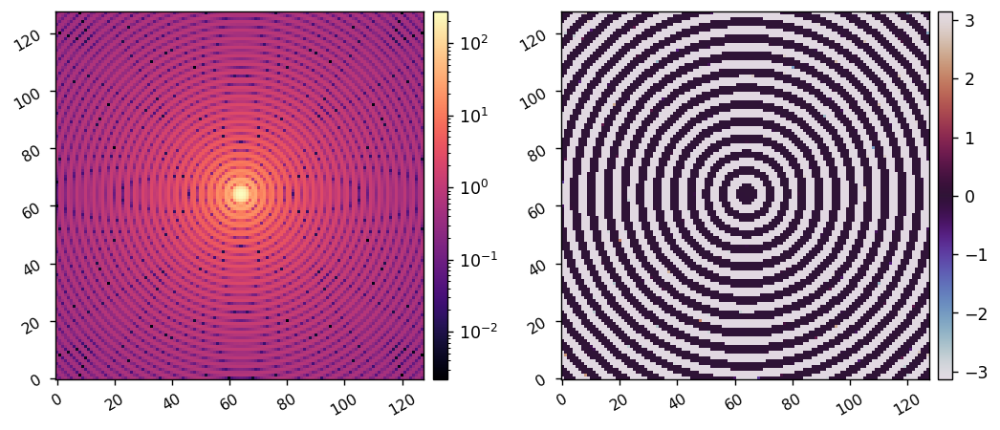

In [79]:
prop_wf, xu, vy, Mx, My = props.mft_forward(E_EP, 1000, 128, 0.347, return_all=1)

imshow2(xp.abs(prop_wf), xp.angle(prop_wf), lognorm1=1, cmap2='twilight')

2048
0.7 m
4.7e-05 m / pix
65.27577820789963
[-66809.75899579 -66744.48321758 -66679.20743937 ...  66679.20743937
  66744.48321758  66809.75899579]


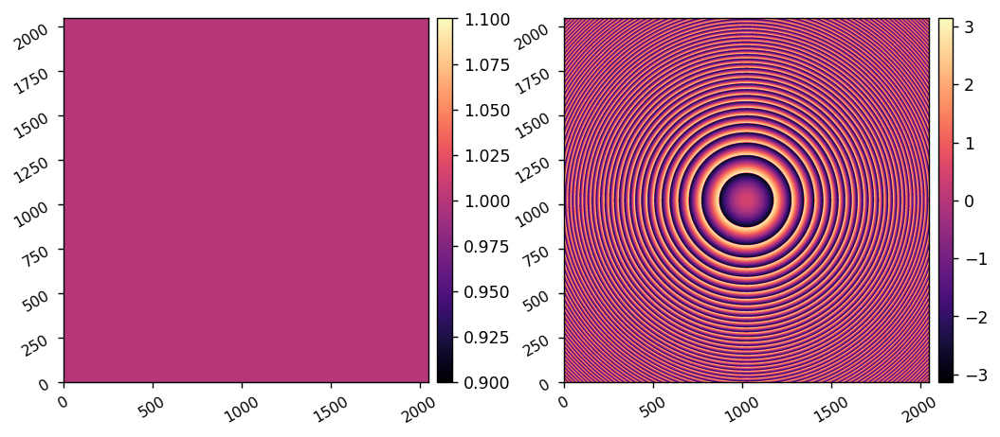

In [72]:
prop_wf, tf = props.ang_spec(E_EP, 650e-9*u.m, 700e-3*u.m, 47e-3/1000*u.m/u.pix, return_tf=1)
imshow2(xp.abs(tf), xp.angle(tf))

In [59]:
1.12e-10-7.09e-11, 6.03e-11 - 2.32e-11

(4.1100000000000005e-11, 3.71e-11)

In [3]:
import pandas as pd
import math

def load_model_data(fname, width):
    data = pd.read_csv(fname)

    # Verify if the CSV has complex data
    if 'real' not in data.columns or 'imag' not in data.columns:
        raise ValueError("CSV must have 'real' and 'imag' columns")

    # Get total entries and calculate dimensions
    total_entries = len(data)
    height = math.ceil(total_entries / width)  # Calculate height based on width

    # Create complex array
    complex_array = data['real'].values + 1j * data['imag'].values

    # Pad the array if necessary to match dimensions
    if total_entries < (width * height):
        pad_size = (width * height) - total_entries
        complex_array = np.pad(complex_array, (0, pad_size), mode='constant', constant_values=0+0j)

    # Reshape using the specified width
    complex_array = xp.array( complex_array.reshape(height, width) )

    return complex_array

    

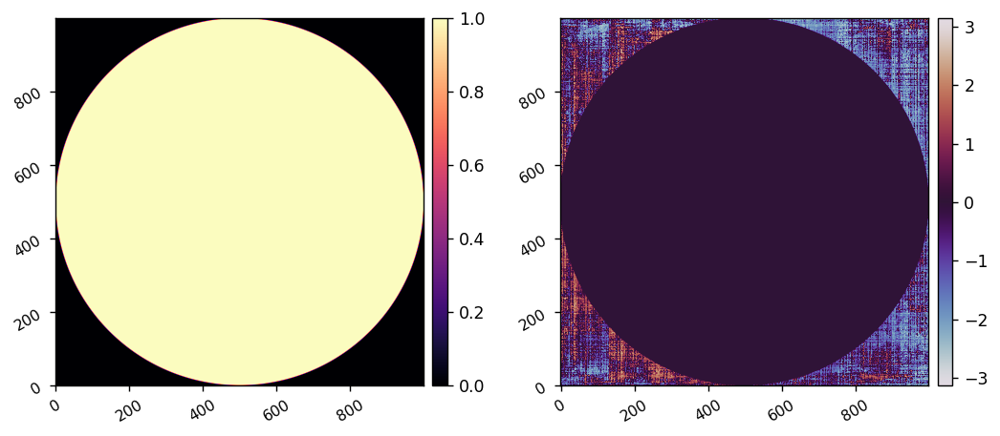

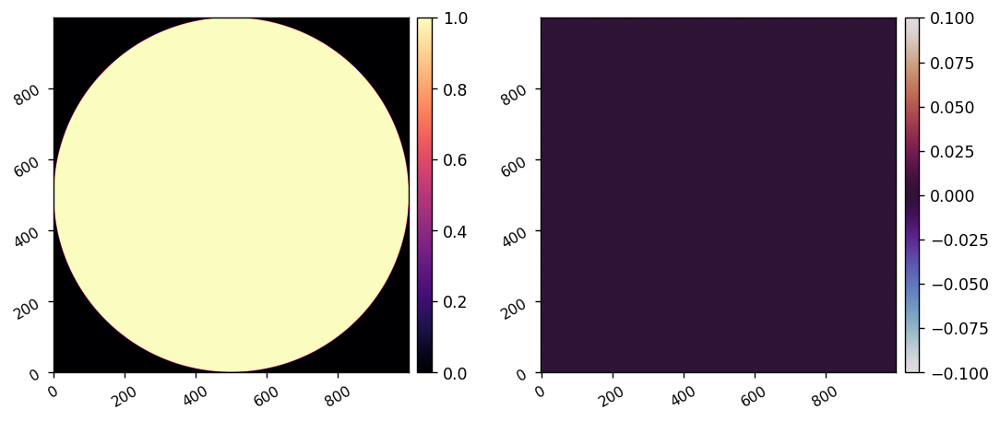

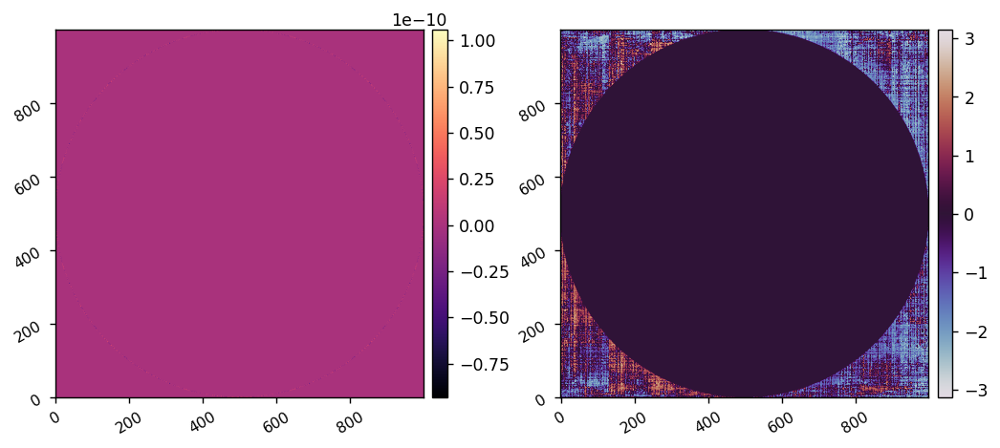

In [73]:
# my_data = E_EP
# data = load_model_data('/home/apra/Documents/images/end_to_end/post_dm1.csv', 1000)

# my_data = E_DM2P
# data = load_model_data('/home/apra/Documents/images/end_to_end/E_DM2P.csv', 2048)

# my_data = E_DM2P * DM2_PHASOR
# data = load_model_data('/home/apra/Documents/images/end_to_end/post_dm2.csv', 2048)

my_data = E_PUP
data = load_model_data('/home/apra/Documents/images/end_to_end/pre_FPM.csv', 2048)

my_amp = utils.pad_or_crop(xp.abs(my_data), 2048)
my_phs = utils.pad_or_crop(xp.angle(my_data), 2048)

amp = utils.pad_or_crop(xp.abs(data), 2048)
phs = utils.pad_or_crop(xp.angle(data), 2048)

imshow2(my_amp, my_phs, cmap2='twilight', npix=1000)
imshow2(amp, phs, cmap2='twilight', npix=1000)
imshow2(my_amp-amp, my_phs-phs, cmap2='twilight', npix=1000)

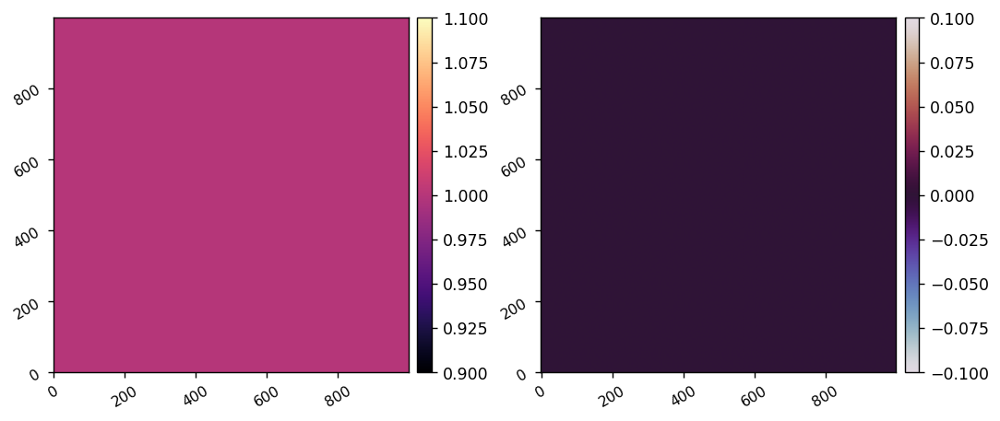

In [63]:

data = load_model_data('/home/apra/Documents/images/end_to_end/dm2_phasor.csv', 2048)

amp = utils.pad_or_crop(xp.abs(data), 2048)
phs = utils.pad_or_crop(xp.angle(data), 2048)

imshow2(amp, phs, cmap2='twilight', npix=1000)

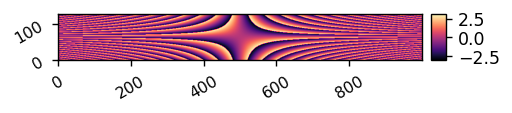

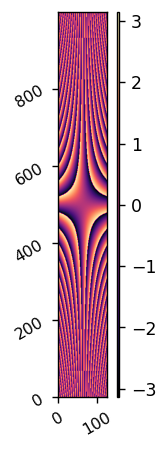

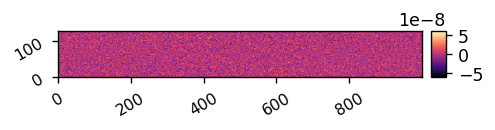

In [109]:
data = load_model_data('/home/apra/Documents/images/end_to_end/Mx.csv', 1000)

imshow1(xp.angle(data))

imshow1(xp.angle(My))

imshow1(xp.angle(data) - xcipy.ndimage.shift(xp.angle(Mx), (0,0)) )

In [11]:
reload(fraunhofer)
reload(props)
Nact = 34
npsf=256

M = fraunhofer.MODEL(
    Nact=Nact,
    npsf=npsf,
)

reload(props)
dm1_command, dm2_command = ( xp.zeros((M.Nact, M.Nact)), xp.zeros((M.Nact, M.Nact)) )
acts = xp.concatenate([dm1_command[M.dm_mask], dm2_command[M.dm_mask]])
M.Imax_ref = 1
E_FP, E_EP, E_DM2P, DM1_PHASOR, DM2_PHASOR, E_PUP, E_LP = M.forward(acts, 650e-9, use_vortex=0, return_ints=1)

(2048, 2048)
2048
700.0 mm
0.047 mm / pix
65.27577820789962
[-66809.75899579 -66744.48321758 -66679.20743937 ...  66679.20743937
  66744.48321758  66809.75899579]
2048
-700.0 mm
0.047 mm / pix
65.27577820789962
[-66809.75899579 -66744.48321758 -66679.20743937 ...  66679.20743937
  66744.48321758  66809.75899579]
[-1.13777778 -1.13666667 -1.13555556 ...  1.13444444  1.13555556
  1.13666667]
[-44.416 -44.069 -43.722 -43.375 -43.028 -42.681 -42.334 -41.987 -41.64
 -41.293 -40.946 -40.599 -40.252 -39.905 -39.558 -39.211 -38.864 -38.517
 -38.17  -37.823 -37.476 -37.129 -36.782 -36.435 -36.088 -35.741 -35.394
 -35.047 -34.7   -34.353 -34.006 -33.659 -33.312 -32.965 -32.618 -32.271
 -31.924 -31.577 -31.23  -30.883 -30.536 -30.189 -29.842 -29.495 -29.148
 -28.801 -28.454 -28.107 -27.76  -27.413 -27.066 -26.719 -26.372 -26.025
 -25.678 -25.331 -24.984 -24.637 -24.29  -23.943 -23.596 -23.249 -22.902
 -22.555 -22.208 -21.861 -21.514 -21.167 -20.82  -20.473 -20.126 -19.779
 -19.432 -19.085 -18.738

[-0.55555556 -0.55444444 -0.55333333 -0.55222222 -0.55111111 -0.55
 -0.54888889 -0.54777778 -0.54666667 -0.54555556 -0.54444444 -0.54333333
 -0.54222222 -0.54111111 -0.54       -0.53888889 -0.53777778 -0.53666667
 -0.53555556 -0.53444444 -0.53333333 -0.53222222 -0.53111111 -0.53
 -0.52888889 -0.52777778 -0.52666667 -0.52555556 -0.52444444 -0.52333333
 -0.52222222 -0.52111111 -0.52       -0.51888889 -0.51777778 -0.51666667
 -0.51555556 -0.51444444 -0.51333333 -0.51222222 -0.51111111 -0.51
 -0.50888889 -0.50777778 -0.50666667 -0.50555556 -0.50444444 -0.50333333
 -0.50222222 -0.50111111 -0.5        -0.49888889 -0.49777778 -0.49666667
 -0.49555556 -0.49444444 -0.49333333 -0.49222222 -0.49111111 -0.49
 -0.48888889 -0.48777778 -0.48666667 -0.48555556 -0.48444444 -0.48333333
 -0.48222222 -0.48111111 -0.48       -0.47888889 -0.47777778 -0.47666667
 -0.47555556 -0.47444444 -0.47333333 -0.47222222 -0.47111111 -0.47
 -0.46888889 -0.46777778 -0.46666667 -0.46555556 -0.46444444 -0.46333333
 -0.4622

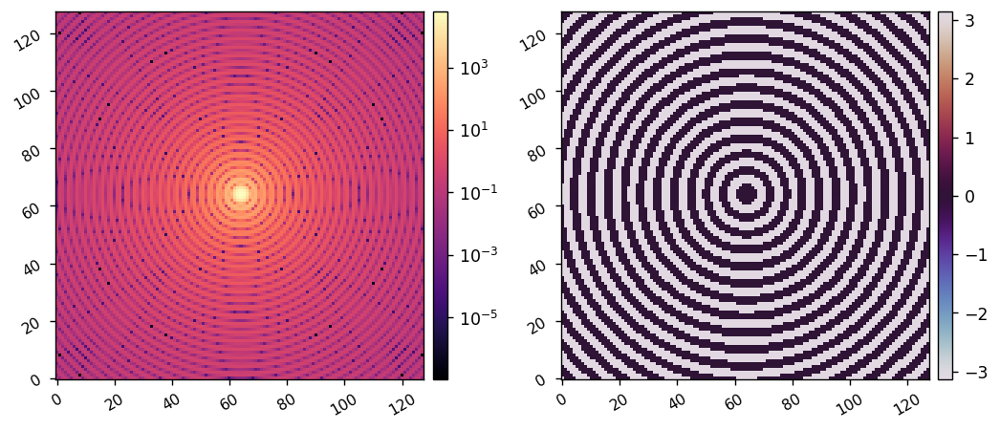

In [21]:
reload(props)
# prop_wf, xu, vy, Mx, My = props.mft_forward(E_EP, 1000, 128, 0.347, return_all=1)
my_psf_wf, xu, vy, Mx, My = props.mft_forward(utils.pad_or_crop(E_LP, 1000)*M.LYOT, 900, 128, 0.347, return_all=1)
my_psf = xp.abs(my_psf_wf)**2
my_psf_phs = xp.angle(my_psf_wf)
imshow2(my_psf, my_psf_phs, lognorm1=1, cmap2='twilight')

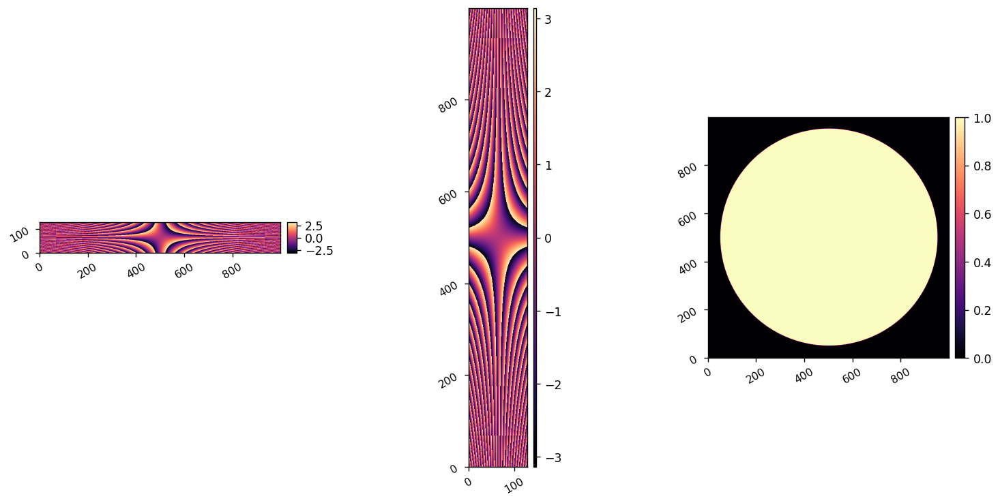

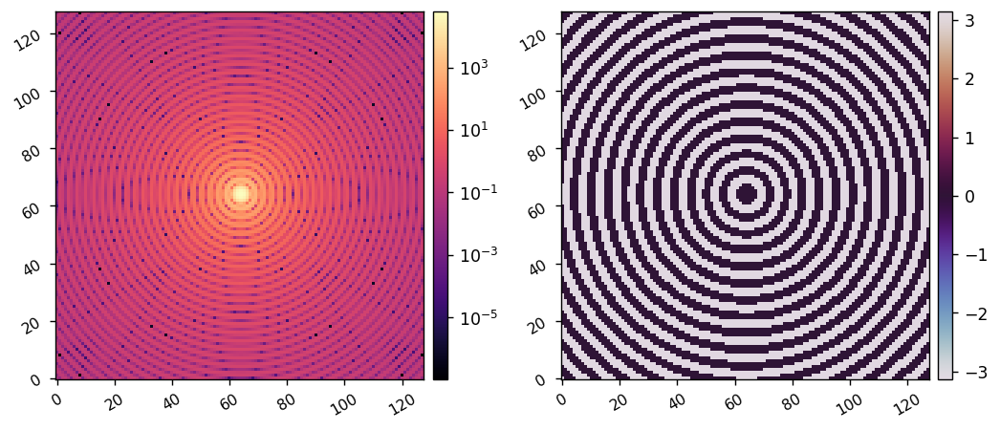

In [20]:
Mx = xp.array( load_model_data('/home/apra/Documents/images/end_to_end/Mx.csv', 1000) )
My = xp.array( load_model_data('/home/apra/Documents/images/end_to_end/My.csv', 128) )
lyot = xp.array( load_model_data('/home/apra/Documents/images/end_to_end/after_lyot.csv', 1000) )

psf_wf = Mx@lyot@My
psf = xp.abs(psf_wf)**2
psf_phs = xp.angle(psf_wf)

imshow3(xp.angle(Mx), xp.angle(My), xp.abs(lyot) )
imshow2(psf, psf_phs, lognorm1=1, cmap2='twilight')

[-0.55555556 -0.55444444 -0.55333333 -0.55222222 -0.55111111 -0.55
 -0.54888889 -0.54777778 -0.54666667 -0.54555556 -0.54444444 -0.54333333
 -0.54222222 -0.54111111 -0.54       -0.53888889 -0.53777778 -0.53666667
 -0.53555556 -0.53444444 -0.53333333 -0.53222222 -0.53111111 -0.53
 -0.52888889 -0.52777778 -0.52666667 -0.52555556 -0.52444444 -0.52333333
 -0.52222222 -0.52111111 -0.52       -0.51888889 -0.51777778 -0.51666667
 -0.51555556 -0.51444444 -0.51333333 -0.51222222 -0.51111111 -0.51
 -0.50888889 -0.50777778 -0.50666667 -0.50555556 -0.50444444 -0.50333333
 -0.50222222 -0.50111111 -0.5        -0.49888889 -0.49777778 -0.49666667
 -0.49555556 -0.49444444 -0.49333333 -0.49222222 -0.49111111 -0.49
 -0.48888889 -0.48777778 -0.48666667 -0.48555556 -0.48444444 -0.48333333
 -0.48222222 -0.48111111 -0.48       -0.47888889 -0.47777778 -0.47666667
 -0.47555556 -0.47444444 -0.47333333 -0.47222222 -0.47111111 -0.47
 -0.46888889 -0.46777778 -0.46666667 -0.46555556 -0.46444444 -0.46333333
 -0.4622

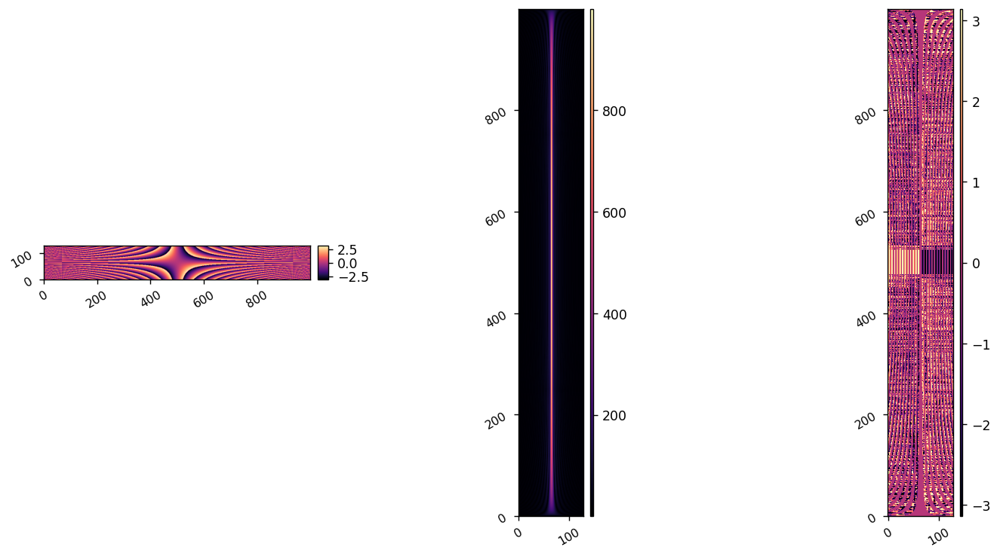

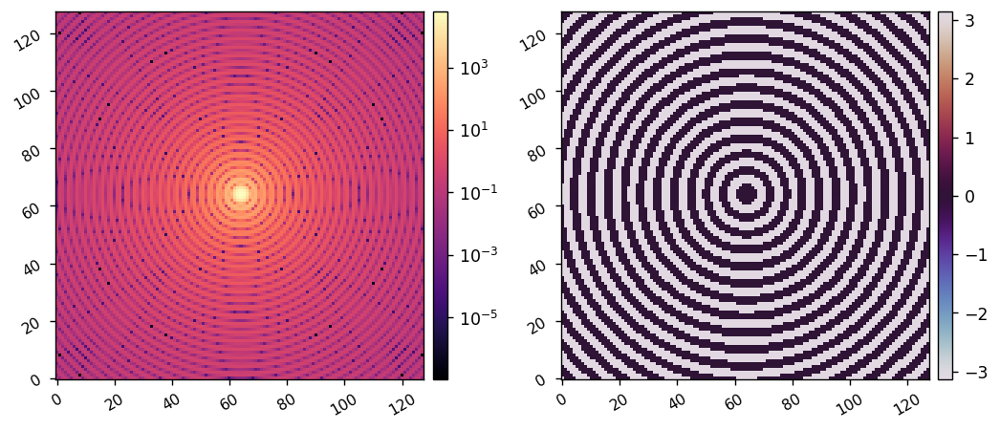

In [26]:
reload(props)
# prop_wf, xu, vy, Mx, My = props.mft_forward(E_EP, 1000, 128, 0.347, return_all=1)
my_psf_wf, xu, vy, Mx, My = props.mft_forward(utils.pad_or_crop(E_LP, 1000)*M.LYOT, 900, 128, 0.347, return_all=1)

my_temp = utils.pad_or_crop(E_LP, 1000)@My

my_psf = xp.abs(my_psf_wf)**2
my_psf_phs = xp.angle(my_psf_wf)

imshow3(xp.angle(Mx), xp.abs(my_temp), xp.angle(my_temp) )
imshow2(my_psf, my_psf_phs, lognorm1=1, cmap2='twilight')

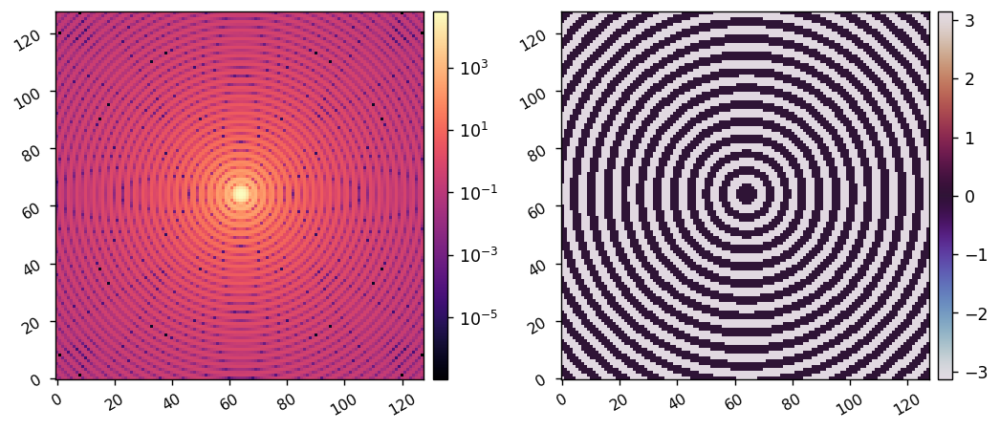

In [27]:
data = load_model_data('/home/apra/Documents/images/end_to_end/psf.csv', 128)

psf = xp.abs(data)**2
psf_phs = xp.angle(data)

imshow2(psf, psf_phs, lognorm1=True, cmap2='twilight', vmin2=-np.pi)

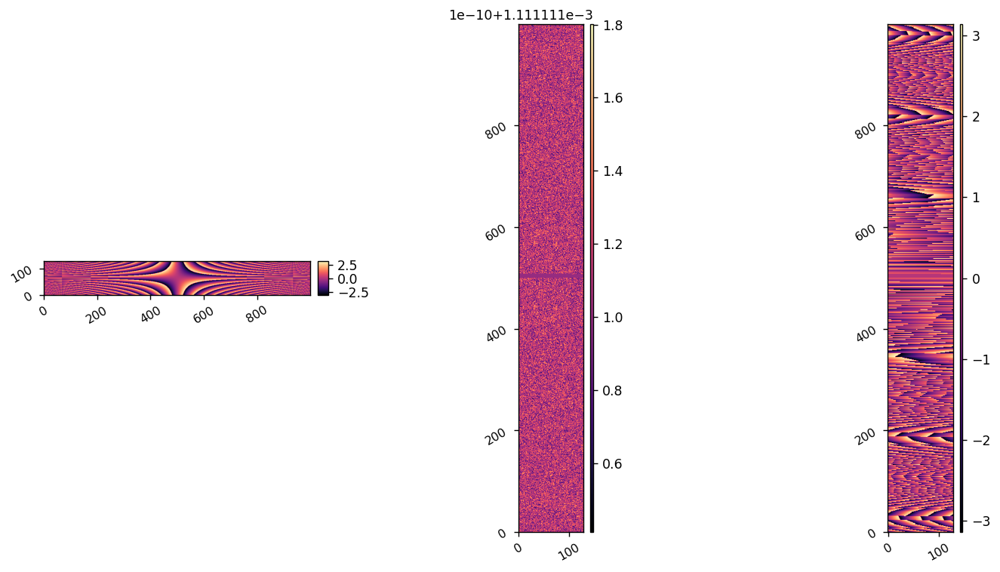

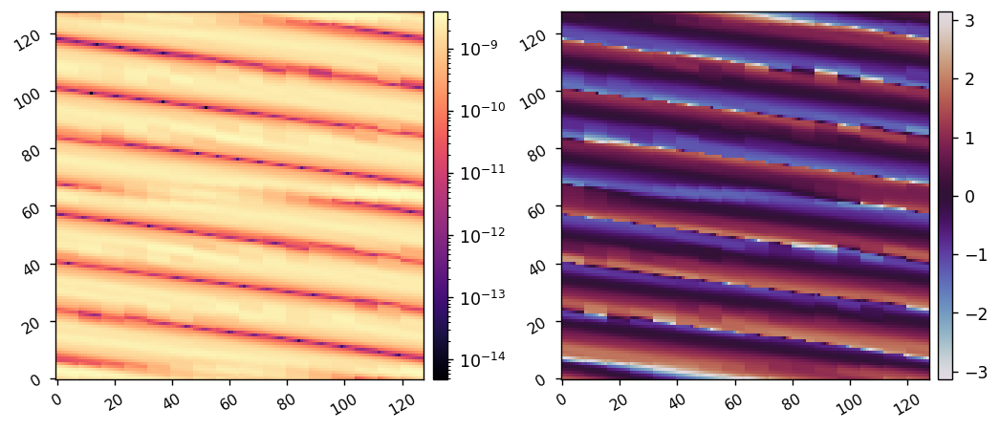

In [24]:
Mx = xp.array( load_model_data('/home/apra/Documents/images/end_to_end/Mx.csv', 1000) )
# My = xp.array( load_model_data('/home/apra/Documents/images/end_to_end/My.csv', 128) )
# lyot = xp.array( load_model_data('/home/apra/Documents/images/end_to_end/after_lyot.csv', 1000) )
temp = xp.array( load_model_data('/home/apra/Documents/images/end_to_end/temp.csv', 128) )

psf_wf = Mx@temp
psf = xp.abs(psf_wf)**2
psf_phs = xp.angle(psf_wf)

imshow3(xp.angle(Mx), xp.abs(temp), xp.angle(temp) )
imshow2(psf, psf_phs, lognorm1=1, cmap2='twilight')

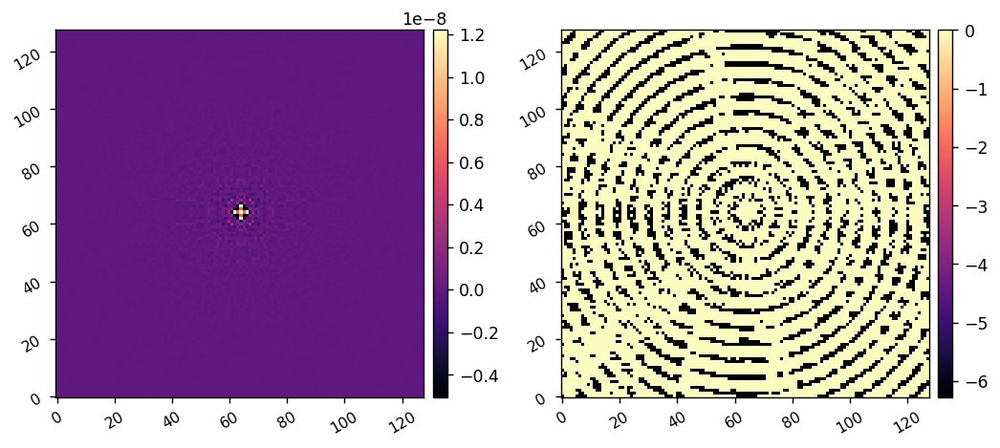

In [28]:
imshow2(my_psf-psf, my_psf_phs-psf_phs,)

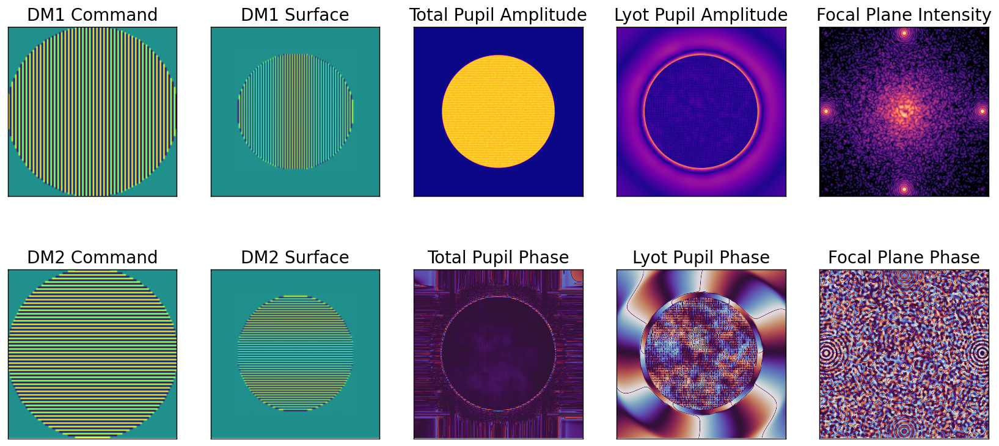

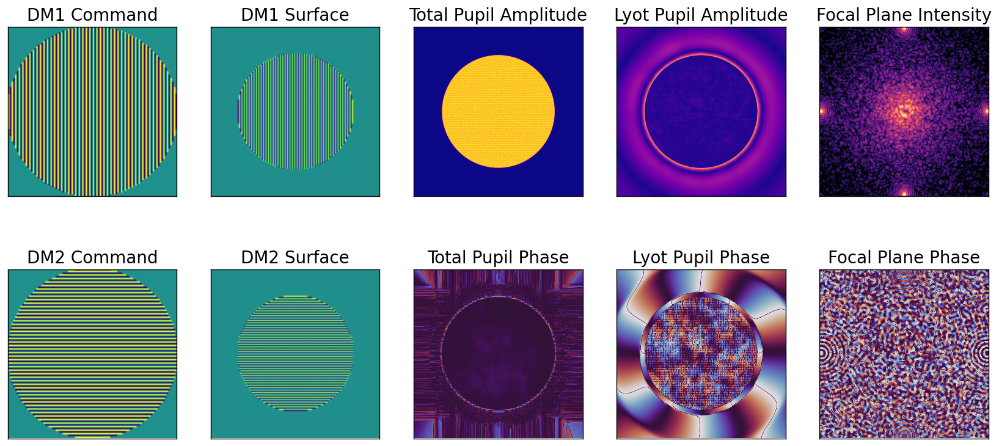

In [13]:
dm1_command, dm2_command = ( xp.zeros((M.Nact, M.Nact)), xp.zeros((M.Nact, M.Nact)) )

dm1_command = 2.5e-9*utils.make_fourier_command(x_cpa=Nact/2, y_cpa=0, Nact=M.Nact)
dm2_command = 2.5e-9*utils.make_fourier_command(x_cpa=0, y_cpa=Nact/2, Nact=M.Nact)

acts = xp.concatenate([dm1_command[M.dm_mask], dm2_command[M.dm_mask]])
fpwf_1 = M.forward(acts, 630e-9, use_vortex=1, fancy_plot=1)
fpwf_2 = M.forward(acts, 670e-9, use_vortex=1, fancy_plot=1)